<a href="https://www.kaggle.com/code/emiz6413/neural-image-compression-with-vae?scriptVersionId=151949585" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

[Tellez *et al.* (2020)](https://arxiv.org/abs/1811.02840) proposed two-stage method to build deep neural networks for gigapixel distopathology image analysis solely using image-level labels.

<img src="https://storage.googleapis.com/ubco/Screenshot%202023-11-16%20at%2011.24.50.png">

The encoder compress gigapixel image to much smaller feature space and the classifier is trained feeding the features created by the encoder.
They tested three different encoding methods: autoencoder, contrastive training, and Bidirectional GAN.

In this notebook, an autoencoder is trained on 128 x 128 patches with latent dimension is 128. Thus, the compression rate is $384 = \frac{3 \times 128 \times 128}{128}$.

In [1]:
from itertools import chain
from pathlib import Path
from typing import Iterator
import random
import json
import os

import numpy as np
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import io, transforms
from torchvision.transforms import functional as F 
from torchvision.utils import make_grid
import pandas as pd
from tqdm.auto import tqdm
import wandb
import matplotlib.pyplot as plt
from kaggle_secrets import UserSecretsClient

In [2]:
IMG_SIZE = 128
INITIAL_EPOCH = 0
LOAD_WEIGHT = None
LAST_EPOCH = 30
BATCH_SIZE = 1024
AMP = torch.cuda.is_available()
DEVICE = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

In [3]:
wandb.login(key=UserSecretsClient().get_secret("WANDB_KEY"))
wandb.init(
    project="UBC-OCEAN",
    config={
        "dataset": "ubco",
        "model": "VAE",
        "last_epoch": LAST_EPOCH,
        "initial_epoch": INITIAL_EPOCH,
        "batch_size": BATCH_SIZE,
        "device": DEVICE,
        "amp": AMP,
    },
)

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: emiz6413. Use `wandb login --relogin` to force relogin
wandb: Tracking run with wandb version 0.16.0
wandb: Run data is saved locally in /kaggle/working/wandb/run-20231123_081123-in0c043g
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run different-firefly-39
wandb: ⭐️ View project at https://wandb.ai/emiz6413/UBC-OCEAN
wandb: 🚀 View run at https://wandb.ai/emiz6413/UBC-OCEAN/runs/in0c043g


### Utils

In [4]:
class AverageMeter:
    def __init__(self) -> None:
        self.reset()

    def reset(self) -> None:
        self.sum = 0
        self.count = 0

    def update(self, val: float, n: int = 1) -> None:
        self.sum += val * n
        self.count += n

    @property
    def average(self) -> float:
        if self.count == 0:
            return 0.0
        return self.sum / self.count

### Dataset and transforms

In [5]:
class UBCODataset(Dataset):
    def __init__(
        self, image_dirs: list[Path], transforms: transforms.Compose
    ) -> None:
        self.image_paths = list(
            chain.from_iterable([d.glob("*.png") for d in image_dirs])
        )
        self.transforms = transforms

    def __len__(self) -> int:
        return len(self.image_paths)

    def __getitem__(self, index: int) -> torch.Tensor:
        img = self.read_image(index)
        return self.transforms(img)

    def read_image(self, idx: int) -> torch.FloatTensor:
        return io.read_image(str(self.image_paths[idx])).float()
    
train_transforms = transforms.Compose(
    [
        transforms.RandomCrop(size=IMG_SIZE),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.Normalize(mean=[0.5 * 255,]*3, std=[0.5 * 255,]*3),
    ]
)

eval_transforms = transforms.Compose(
    [
        transforms.CenterCrop(size=IMG_SIZE),
        transforms.Normalize(mean=[0.5 * 255,]*3, std=[0.5 * 255,]*3),
    ]
)

reverse_transform = transforms.Compose(
    [
        transforms.Normalize(mean=[-1,]*3, std=[2,]*3),
        transforms.ToPILImage()
    ]
)

### Model

In [6]:
class EncoderBlock(nn.Module):
    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        kernel_size: int = 3,
        padding: int = 1,
        stride: int = 2,
    ) -> None:
        super().__init__()
        self.conv = nn.Conv2d(
            in_channels=in_channels,
            out_channels=out_channels,
            kernel_size=kernel_size,
            stride=stride,
            padding=padding,
        )
        self.bn = nn.BatchNorm2d(num_features=out_channels)
        self.activation = nn.LeakyReLU(inplace=True)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        x = self.bn(x)
        x = self.activation(x)
        return x


class DecoderBlock(nn.Module):
    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        kernel_size: int = 3,
        padding: int = 1,
    ) -> None:
        super().__init__()
        self.upsample = nn.UpsamplingNearest2d(scale_factor=2)
        self.conv = nn.Conv2d(
            in_channels=in_channels,
            out_channels=out_channels,
            kernel_size=kernel_size,
            padding=padding,
        )
        self.bn = nn.BatchNorm2d(num_features=out_channels)
        self.activation = nn.LeakyReLU(inplace=True)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.upsample(x)
        x = self.conv(x)
        x = self.bn(x)
        x = self.activation(x)
        return x


class Encoder128(nn.Module):
    def __init__(
        self,
        latent_dim: int = 128,
        out_channels: tuple[int, int, int, int, int] = (32, 64, 128, 256, 512),
    ) -> None:
        super().__init__()
        self.blocks = nn.Sequential()
        in_channels = 3
        for out_channel in out_channels:
            self.blocks.append(EncoderBlock(in_channels=in_channels, out_channels=out_channel))
            in_channels = out_channel

        self.linear1 = nn.Linear(in_features=out_channel * 4 * 4, out_features=512)
        self.bn = nn.BatchNorm1d(num_features=512)
        self.activation = nn.LeakyReLU(inplace=True)
        self.linear2 = nn.Linear(in_features=512, out_features=latent_dim)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.blocks(x)  # bs, 512, 4, 4
        x = x.flatten(start_dim=1)
        x = self.linear1(x)
        x = self.bn(x)
        x = self.activation(x)
        x = self.linear2(x)
        return x


class Decoder128(nn.Module):
    def __init__(
        self,
        latent_dim: int = 128,
        out_channels: tuple[int, int, int, int, int] = (256, 128, 64, 32, 16),
    ) -> None:
        super().__init__()
        self.pre_linear = nn.Sequential(
            nn.Linear(in_features=latent_dim, out_features=512 * 4 * 4),
            nn.BatchNorm1d(num_features=512 * 4 * 4),
            nn.LeakyReLU(inplace=True),
        )

        self.blocks = nn.Sequential()
        in_channels = 512
        for out_channel in out_channels:
            self.blocks.append(DecoderBlock(in_channels=in_channels, out_channels=out_channel))
            in_channels = out_channel

        self.final_conv = nn.Sequential(
            nn.Conv2d(in_channels=out_channel, out_channels=3, kernel_size=3, padding=1),
            nn.Tanh(),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.pre_linear(x)
        x = x.view(x.size(0), 512, 4, 4)
        x = self.blocks(x)
        x = self.final_conv(x)
        return x


class VanillaVAE(nn.Module):
    def __init__(
        self,
        encoder: nn.Module,
        decoder: nn.Module,
        latent_dim: int = 128,
        kl_w: float = 5e-5,
        device: torch.device = torch.device("cuda"),
        amp: bool = False,
    ) -> None:
        super().__init__()
        self.encoder = encoder
        self.decoder = decoder

        self.fc_mu = nn.Linear(latent_dim, latent_dim)
        self.fc_var = nn.Linear(latent_dim, latent_dim)
        self.kl_w = kl_w
        self.optimizer = self.configure_optimizer()
        self.device = device
        self.scaler = torch.cuda.amp.grad_scaler.GradScaler(enabled=amp)

    def configure_optimizer(self) -> torch.optim.Optimizer:
        self.optimizer = torch.optim.Adam(self.parameters(), lr=1e-4)
        return self.optimizer

    def encode(self, x: torch.Tensor) -> tuple[torch.Tensor, torch.Tensor]:
        x = self.encoder(x)
        mu = self.fc_mu(x)
        log_var = self.fc_var(x)

        return mu, log_var

    def decode(self, z: torch.Tensor) -> torch.Tensor:
        return self.decoder(z)

    def reparameterize(self, mu: torch.Tensor, log_var: torch.Tensor) -> torch.Tensor:
        std = torch.exp(0.5 * log_var)
        eps = torch.rand_like(std)

        return mu + eps * std

    def forward(self, x: torch.Tensor) -> tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
        x = x.to(self.device)
        mu, log_var = self.encode(x)
        z = self.reparameterize(mu, log_var)
        x_hat = self.decode(z)
        return x_hat, mu, log_var

    def compute_losses(
        self,
        x: torch.Tensor,
        x_hat: torch.Tensor,
        mu: torch.Tensor,
        log_var: torch.Tensor,
    ) -> tuple[torch.Tensor, torch.Tensor]:
        x = x.to(x_hat.device)
        rec_loss = nn.functional.mse_loss(input=x_hat, target=x, reduction="mean")

        kl_loss = -0.5 * torch.sum(1 + log_var - mu**2 - log_var.exp(), dim=1)
        kl_loss = torch.mean(kl_loss)

        return rec_loss, kl_loss

    def train_step(self, x: torch.Tensor) -> tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
        self.optimizer.zero_grad()
        with torch.cuda.amp.autocast(enabled=self.scaler.is_enabled()):
            x_hat, mu, log_var = self.forward(x)
            rec_loss, kl_loss = self.compute_losses(x, x_hat, mu, log_var)
            loss = rec_loss + self.kl_w * kl_loss
        self.scaler.scale(loss).backward()
        self.scaler.step(self.optimizer)
        self.scaler.update()
        return loss, rec_loss, kl_loss

    @torch.no_grad()
    def eval_step(self, x: torch.Tensor) -> torch.Tensor:
        with torch.cuda.amp.autocast(enabled=self.scaler.is_enabled()):
            x_hat, mu, log_var = self.forward(x)
            rec_loss, kl_loss = self.compute_losses(x, x_hat, mu, log_var)
            loss = rec_loss + self.kl_w * kl_loss
        return loss, rec_loss, kl_loss

    def train_single_epoch(self, data_loader: DataLoader) -> tuple[float, float, float]:
        self.train()
        loss = AverageMeter()
        rec_loss = AverageMeter()
        kl_loss = AverageMeter()
        pbar = tqdm(total=len(data_loader))
        for x in data_loader:
            _loss, _rec_loss, _kl_loss = self.train_step(x)
            if not torch.isfinite(_loss):
                raise RuntimeError(f"loss not finite: {_loss}")
            loss.update(_loss.item())
            rec_loss.update(_rec_loss.item())
            kl_loss.update(_kl_loss.item())
            pbar.set_description(
                f"loss: {loss.average:.3f} rec loss: {rec_loss.average:.3f} kl loss: {kl_loss.average:.3f}"
            )
            pbar.update()
        pbar.close()
        return loss.average, rec_loss.average, kl_loss.average

    def evaluate(self, data_loader: DataLoader) -> tuple[float, float, float]:
        self.eval()
        loss = AverageMeter()
        rec_loss = AverageMeter()
        kl_loss = AverageMeter()
        pbar = tqdm(total=len(data_loader))
        for x in data_loader:
            _loss, _rec_loss, _kl_loss = self.eval_step(x)
            loss.update(_loss.item())
            rec_loss.update(_rec_loss.item())
            kl_loss.update(_kl_loss.item())
            pbar.set_description(
                f"loss: {loss.average:.3f} rec loss: {rec_loss.average:.3f} kl loss: {kl_loss.average:.3f}"
            )
            pbar.update()
        pbar.close()
        return loss.average, rec_loss.average, kl_loss.average

### Instantiate datasets

In [7]:
# For details of tile creation, please refer pjmathematician's notebook: 
# https://www.kaggle.com/code/pjmathematician/ucbo-tilemaker
# For details of the split, please refer: 
# https://www.kaggle.com/code/emiz6413/stratified-shuffle-split/notebook
meta_df = pd.read_csv("/kaggle/input/save-stratified-split-to-csv/train_split.csv")
train_image_ids = meta_df[meta_df["is_train"]]["image_id"].values
eval_image_ids = meta_df[~meta_df["is_train"]]["image_id"].values
train_image_dirs = [next(Path("/kaggle/input/").glob(f"ucbo-tiles-256-*/256_{img_id}")) for img_id in train_image_ids]
eval_image_dirs = [next(Path("/kaggle/input/").glob(f"ucbo-tiles-256-*/256_{img_id}")) for img_id in eval_image_ids]

In [8]:
train_ds = UBCODataset(train_image_dirs, transforms=train_transforms)
eval_ds = UBCODataset(eval_image_dirs, transforms=eval_transforms)

print("before filtering")
print(f"len(train_ds): {len(train_ds)}")
print(f"len(eval_ds): {len(eval_ds)}")

# Some patches are completely black and white useless patches.
# We will discard those patches by thresholding colorfulness of an image.
with open("/kaggle/input/make-image-colorfulness-json/colorfulness.json", "r") as f:
    colorfulness = json.load(f)

valid_train_idx = np.arange(len(train_ds))[np.array([colorfulness[str(i.stem)] for i in train_ds.image_paths]) > 5]
valid_eval_idx = np.arange(len(eval_ds))[np.array([colorfulness[str(i.stem)] for i in eval_ds.image_paths]) > 5]
train_ds = Subset(train_ds, valid_train_idx)
eval_ds = Subset(eval_ds, valid_eval_idx)

print("after filtering")
print(f"len(train_ds): {len(train_ds)}")
print(f"len(eval_ds): {len(eval_ds)}")
wandb.log({"train_size": len(train_ds), "eval_size": len(eval_ds)})

train_loader = DataLoader(dataset=train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=os.cpu_count())
eval_loader = DataLoader(dataset=eval_ds, batch_size=BATCH_SIZE*2, shuffle=False, num_workers=os.cpu_count())

before filtering
len(train_ds): 379834
len(eval_ds): 106524
after filtering
len(train_ds): 336592
len(eval_ds): 90093


### Visualize the first few samples
Note: Although entirely black and white images are filtered, crop of colorful image may be black and white

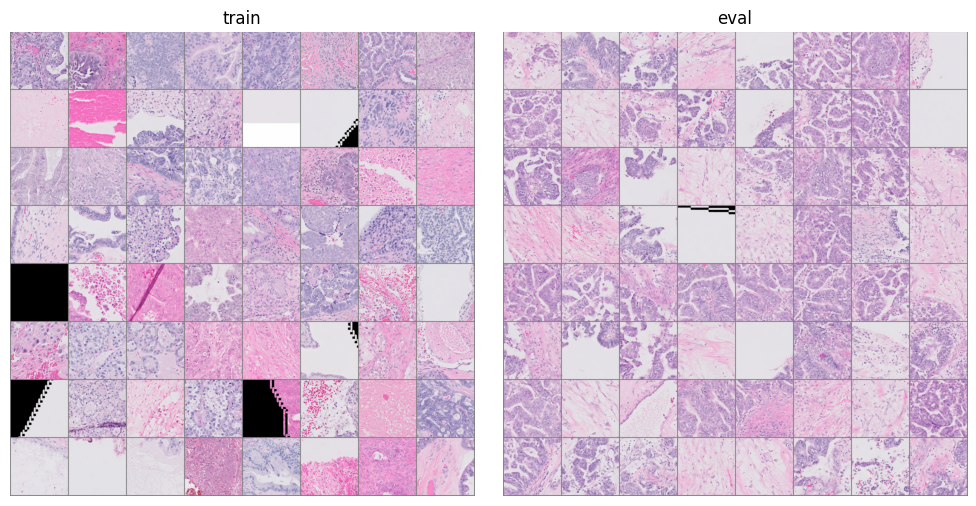

In [9]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

train_imgs = next(iter(train_loader))[:64]
val_imgs = next(iter(eval_loader))[:64]

for ax, img, title in zip(axes, [train_imgs, val_imgs], ["train", "eval"]):
    ax.imshow(reverse_transform(make_grid(img, nrow=8)))
    ax.axis("off")
    ax.set_title(title)

fig.tight_layout()
wandb.log({"sample": fig})
fig.show()

### Train

In [10]:
decoder = Decoder128()
encoder = Encoder128()

model = VanillaVAE(encoder=encoder, decoder=decoder, amp=AMP, device=DEVICE)
model = model.to(DEVICE)
if LOAD_WEIGHT is not None:
    model.load_state_dict(torch.load(LOAD_WEIGHT))

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

/tmp/ipykernel_26/2322204314.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, 2)


  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/329 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

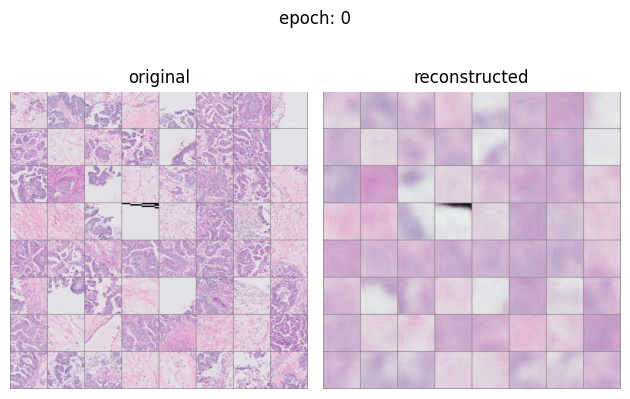

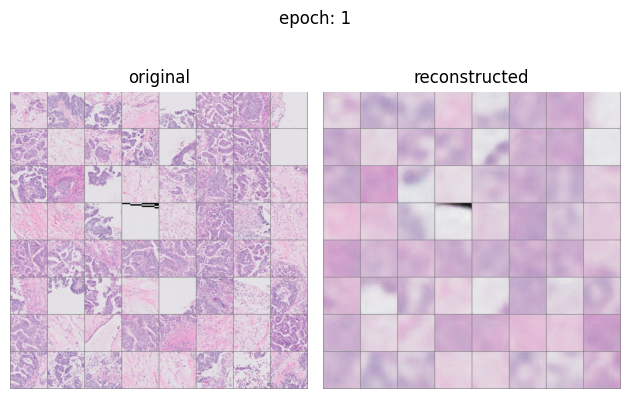

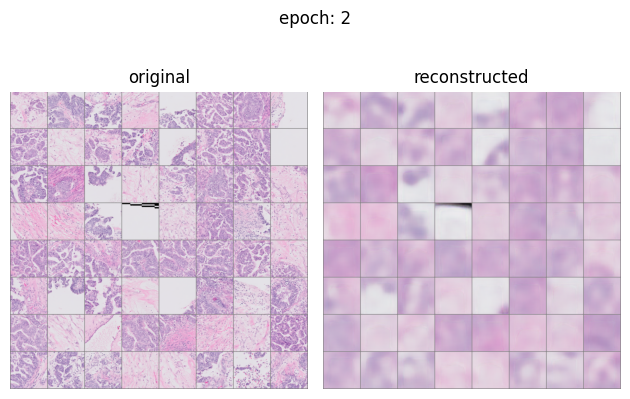

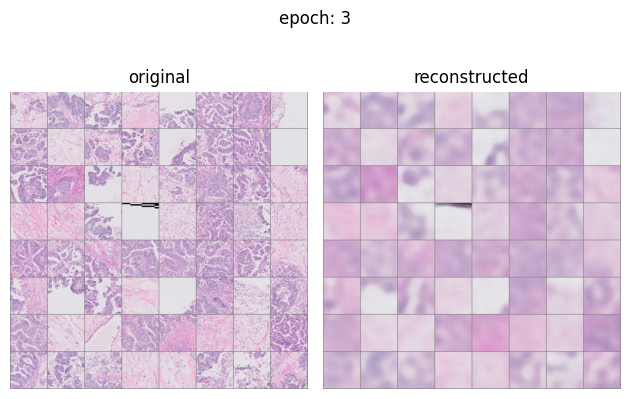

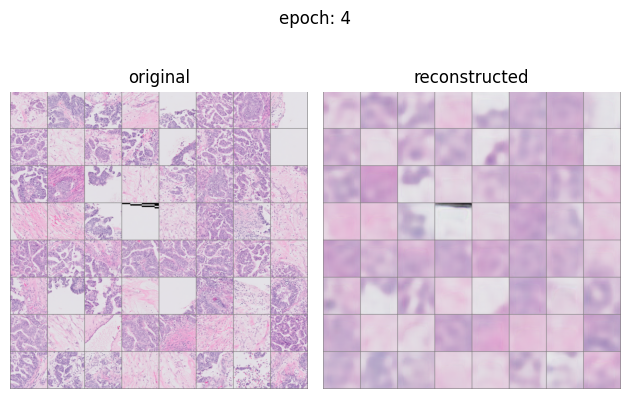

...

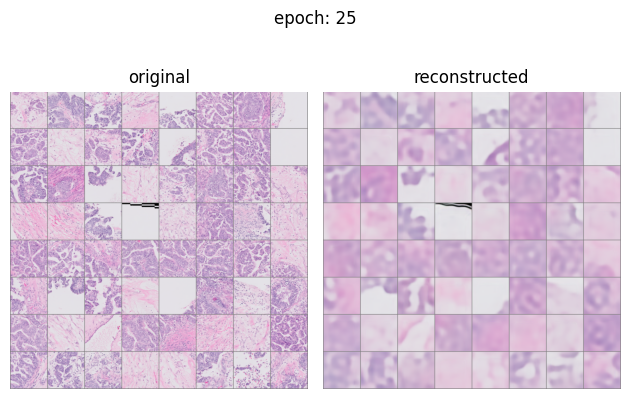

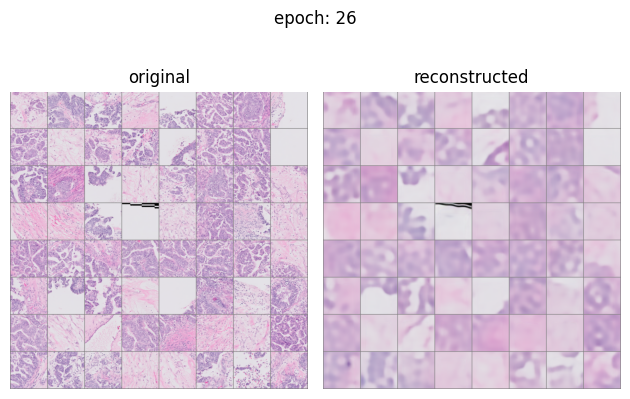

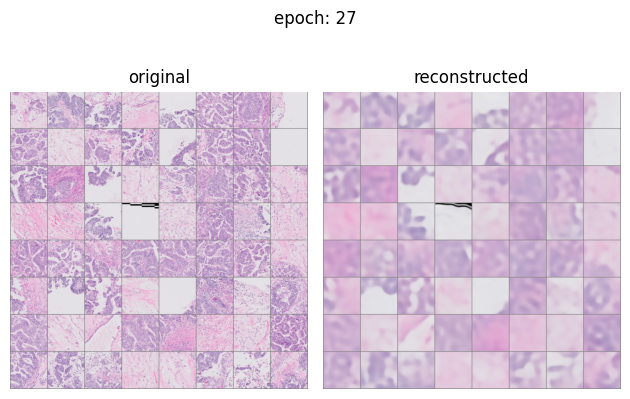

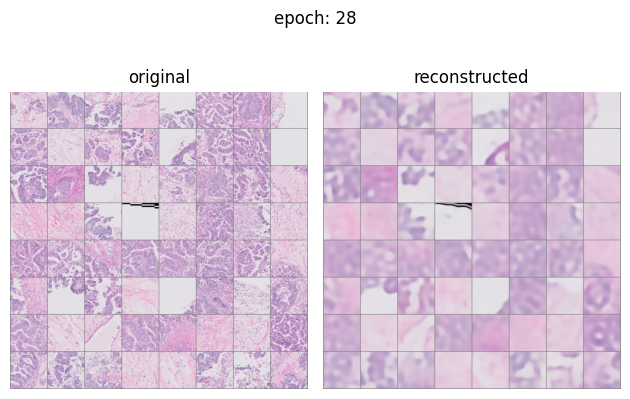

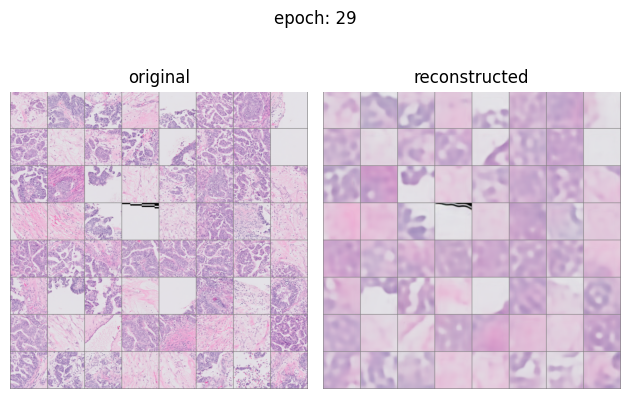

In [11]:
pbar = tqdm(total=LAST_EPOCH-INITIAL_EPOCH)

for epoch in range(INITIAL_EPOCH, LAST_EPOCH):
    train_loss, train_rec_loss, train_kl_loss = model.train_single_epoch(data_loader=train_loader)

    eval_loss, eval_rec_loss, eval_kl_loss = model.evaluate(data_loader=eval_loader)
    pbar.set_description(f"epoch: {epoch} train loss: {train_loss:.3f} eval loss: {eval_loss:.3f}")
    wandb.log(
        {
            "train_loss": train_loss,
            "train_rec_loss": train_rec_loss,
            "train_kl_loss": train_kl_loss,
            "eval_loss": eval_loss,
            "eval_rec_loss": eval_rec_loss,
            "eval_kl_loss": eval_kl_loss,
        },
        step=epoch
    )
    
    with torch.no_grad():
        sample_img = next(iter(eval_loader))[:64]
        rec_img, *_ = model(sample_img)

    fig, axes = plt.subplots(1, 2)

    for ax, img, title in zip(axes, [sample_img, rec_img], ["original", "reconstructed"]):
        ax.imshow(reverse_transform(make_grid(img, nrow=8)))
        ax.axis("off")
        ax.set_title(title)

    fig.tight_layout()
    fig.suptitle(f"epoch: {epoch}")
    wandb.log({"reconstruted_image": fig}, step=epoch)
    torch.save(model.state_dict(), f"vae_ubco_epoch{epoch}_loss{eval_loss:.3f}.pth")
    
    pbar.update()

pbar.close()